### Importación de datos



In [15]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



In [41]:
from google.colab import files
import pandas as pd
import re

# Subir archivos
uploaded = files.upload()

# Guardar y leer archivos automáticamente
dataframes = {}
for nombre in uploaded.keys():
    with open(nombre, "wb") as f:
        f.write(uploaded[nombre])

    # Normalizar nombre: quitar sufijos como (6)
    nombre_limpio = re.sub(r"\s*\(\d+\)", "", nombre.split(".")[0])
    dataframes[nombre_limpio] = pd.read_csv(nombre)

# Acceder a los DataFrames
tienda1 = dataframes["tienda_1"]
tienda2 = dataframes["tienda_2"]
tienda3 = dataframes["tienda_3"]
tienda4 = dataframes["tienda_4"]

# Verificar
print(tienda1.head())

Saving tienda_1 .csv to tienda_1  (12).csv
Saving tienda_2.csv to tienda_2 (12).csv
Saving tienda_3.csv to tienda_3 (12).csv
Saving tienda_4.csv to tienda_4 (12).csv
            Producto Categoría del Producto    Precio  Costo de envío  \
0  Asistente virtual           Electrónicos  164300.0          6900.0   
1    Mesa de comedor                Muebles  192300.0          8400.0   
2      Juego de mesa               Juguetes  209600.0         15900.0   
3         Microondas      Electrodomésticos  757500.0         41000.0   
4   Silla de oficina                Muebles  335200.0         20200.0   

  Fecha de Compra         Vendedor Lugar de Compra  Calificación  \
0      16/01/2021      Pedro Gomez          Bogotá             4   
1      18/05/2022  Beatriz Morales        Medellín             1   
2      15/03/2021   Juan Fernandez       Cartagena             1   
3      03/05/2022   Juan Fernandez            Cali             4   
4      07/11/2020    Maria Alfonso        Medellín     

In [45]:
# Añadir columna de origen a cada DataFrame
dataframes["tienda_1"]["Tienda"] = "Tienda 1"
dataframes["tienda_2"]["Tienda"] = "Tienda 2"
dataframes["tienda_3"]["Tienda"] = "Tienda 3"
dataframes["tienda_4"]["Tienda"] = "Tienda 4"

# Unir todos en un solo DataFrame
df_tiendas = pd.concat([
    dataframes["tienda_1"],
    dataframes["tienda_2"],
    dataframes["tienda_3"],
    dataframes["tienda_4"]
], ignore_index=True)

# Verificar
print(df_tiendas.head())

            Producto Categoría del Producto    Precio  Costo de envío  \
0  Asistente virtual           Electrónicos  164300.0          6900.0   
1    Mesa de comedor                Muebles  192300.0          8400.0   
2      Juego de mesa               Juguetes  209600.0         15900.0   
3         Microondas      Electrodomésticos  757500.0         41000.0   
4   Silla de oficina                Muebles  335200.0         20200.0   

  Fecha de Compra         Vendedor Lugar de Compra  Calificación  \
0      16/01/2021      Pedro Gomez          Bogotá             4   
1      18/05/2022  Beatriz Morales        Medellín             1   
2      15/03/2021   Juan Fernandez       Cartagena             1   
3      03/05/2022   Juan Fernandez            Cali             4   
4      07/11/2020    Maria Alfonso        Medellín             5   

       Método de pago  Cantidad de cuotas       lat       lon    Tienda  
0  Tarjeta de crédito                   8   4.60971 -74.08175  Tienda 1  
1  T

In [47]:
df_tiendas["Fecha de Compra"] = pd.to_datetime(df_tiendas["Fecha de Compra"], dayfirst=True, errors="coerce")
df_tiendas = df_tiendas.dropna(subset=["Fecha de Compra"])

In [48]:
# Total de ventas por categoría
ventas_categoria = df_tiendas.groupby("Categoría del Producto")["Precio"].sum().sort_values(ascending=False)

# Total por tienda
ventas_tienda = df_tiendas.groupby("Tienda")["Precio"].sum()

# Distribución por método de pago
metodos_pago = df_tiendas["Método de pago"].value_counts()

In [49]:
# Agrupar por mes
df_tiendas["Mes"] = df_tiendas["Fecha de Compra"].dt.to_period("M")
ventas_mensuales = df_tiendas.groupby("Mes")["Precio"].sum()

In [70]:
import folium

mapa = folium.Map(location=[4.5709, -74.2973], zoom_start=5)
for _, fila in df_tiendas.iterrows():
    folium.CircleMarker(
        location=[fila["lat"], fila["lon"]],
        radius=3,
        popup=f"{fila['Producto']} - {fila['Lugar de Compra']}",
        color="blue",
        fill=True
    ).add_to(mapa)

mapa

In [51]:
df_tiendas.to_csv("facturacion_limpia.csv", index=False)

In [55]:
# Este bloque convierte las fechas al formato datetime
df_tiendas["Fecha de Compra"] = pd.to_datetime(df_tiendas["Fecha de Compra"], dayfirst=True)

In [56]:
df_tiendas.to_csv("facturacion_limpia.csv", index=False)

In [58]:
df_tiendas["Fecha de Compra"] = pd.to_datetime(df_tiendas["Fecha de Compra"], dayfirst=True, errors="coerce")
df_tiendas = df_tiendas.dropna(subset=["Fecha de Compra"])

In [59]:
ventas_categoria = df_tiendas.groupby("Categoría del Producto")["Precio"].sum().sort_values(ascending=False)

In [60]:
ventas_tienda = df_tiendas.groupby("Tienda")["Precio"].sum()

In [61]:
metodos_pago = df_tiendas["Método de pago"].value_counts()

In [62]:
df_tiendas["Mes"] = df_tiendas["Fecha de Compra"].dt.to_period("M")
ventas_mensuales = df_tiendas.groupby("Mes")["Precio"].sum()

In [63]:
df_tiendas.to_csv("facturacion_limpia.csv", index=False)

 Productos más vendidos por categorí

In [64]:
ventas_categoria.head()

,Precio
Categoría del Producto,
Electrónicos,1.660576e+09
Electrodomésticos,1.324751e+09
Muebles,7.576610e+08
Instrumentos musicales,3.487726e+08
Deportes y diversión,1.429777e+08


Rendimiento Por Tienda

In [65]:
ventas_tienda.sort_values(ascending=False)

,Precio
Tienda,
Tienda 1,1.150880e+09
Tienda 2,1.116344e+09
Tienda 3,1.098020e+09
Tienda 4,1.038376e+09


Estacionalidad en ventas mensuales

<Axes: xlabel='Mes'>

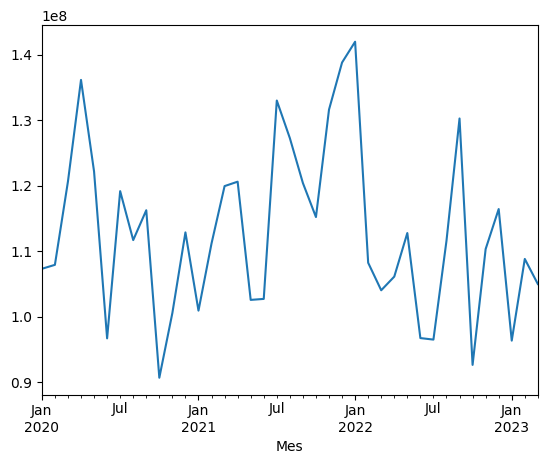

In [66]:
ventas_mensuales.plot()

Preferencias de Método de Pago

In [67]:
metodos_pago

,count
Método de pago,
Tarjeta de crédito,6898
Nequi,1900
Cupón,504
Tarjeta de débito,133


Ubicación del mapa Interactivo

In [73]:
location=[4.5709, -74.2973]

Exportación de datos Limpios

In [68]:
df_tiendas.to_csv("facturacion_limpia.csv", index=False)

# 2. Ventas por categoría

In [78]:
ventas_categoria = df_tiendas.groupby("Categoría del Producto")["Precio"].sum().sort_values(ascending=False)

/tmp/ipython-input-1403749994.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ventas_categoria.values, y=ventas_categoria.index, palette="Blues_r")


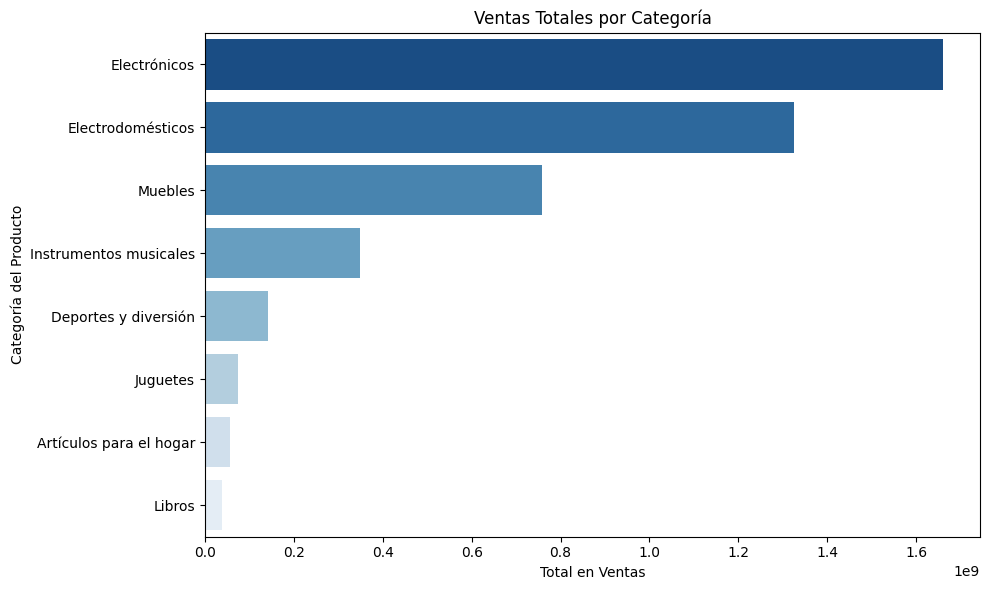

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
sns.barplot(x=ventas_categoria.values, y=ventas_categoria.index, palette="Blues_r")
plt.title("Ventas Totales por Categoría")
plt.xlabel("Total en Ventas")
plt.ylabel("Categoría del Producto")
plt.tight_layout()
plt.show()

# 3. Calificación promedio de la tienda


In [80]:
calificacion_promedio = df_tiendas.groupby("Tienda")["Calificación"].mean().sort_values(ascending=False)

/tmp/ipython-input-289424769.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=calificacion_promedio.values, y=calificacion_promedio.index, palette="viridis")


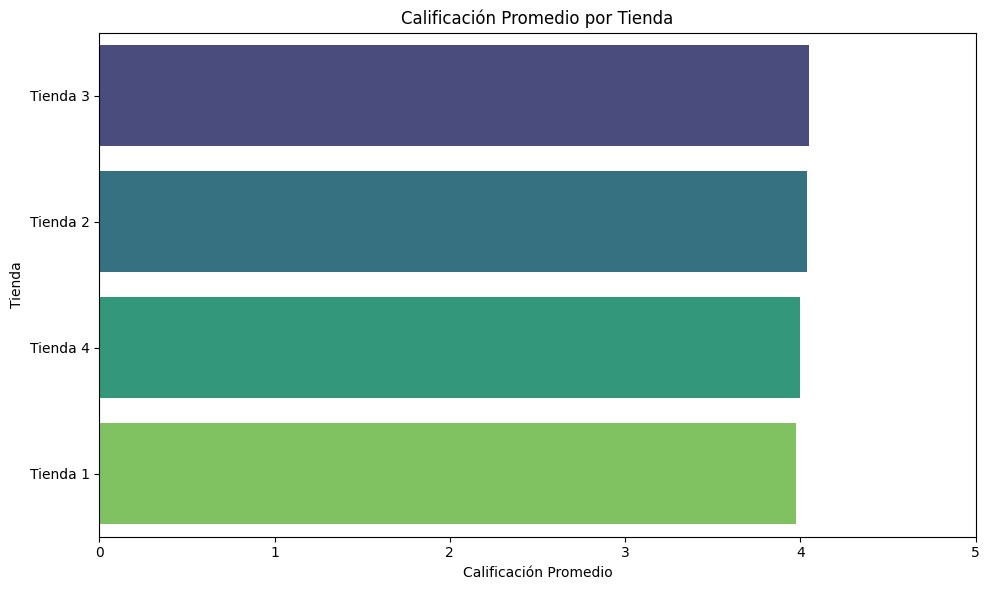

In [81]:
plt.figure(figsize=(10,6))
sns.barplot(x=calificacion_promedio.values, y=calificacion_promedio.index, palette="viridis")
plt.title("Calificación Promedio por Tienda")
plt.xlabel("Calificación Promedio")
plt.ylabel("Tienda")
plt.xlim(0, 5)  # Asumiendo escala de 0 a 5
plt.tight_layout()
plt.show()

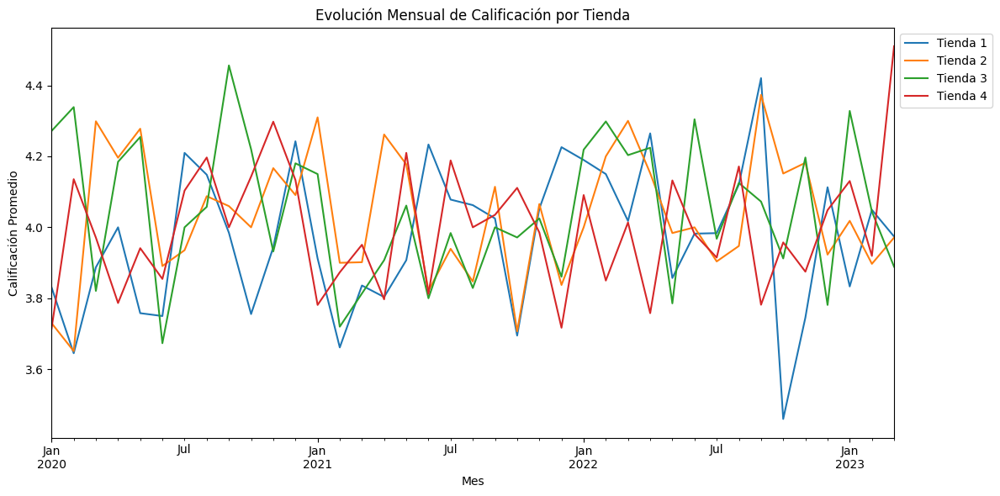

In [82]:
df_tiendas["Mes"] = df_tiendas["Fecha de Compra"].dt.to_period("M")
calificacion_mes = df_tiendas.groupby(["Mes", "Tienda"])["Calificación"].mean().unstack().fillna(0)

calificacion_mes.plot(figsize=(12,6))
plt.title("Evolución Mensual de Calificación por Tienda")
plt.xlabel("Mes")
plt.ylabel("Calificación Promedio")
plt.legend(loc="upper left", bbox_to_anchor=(1,1))
plt.tight_layout()
plt.show()

In [85]:
ventas_calificacion = df_tiendas.groupby("Tienda")[["Precio", "Calificación"]].mean().sort_values(by="Precio", ascending=False)

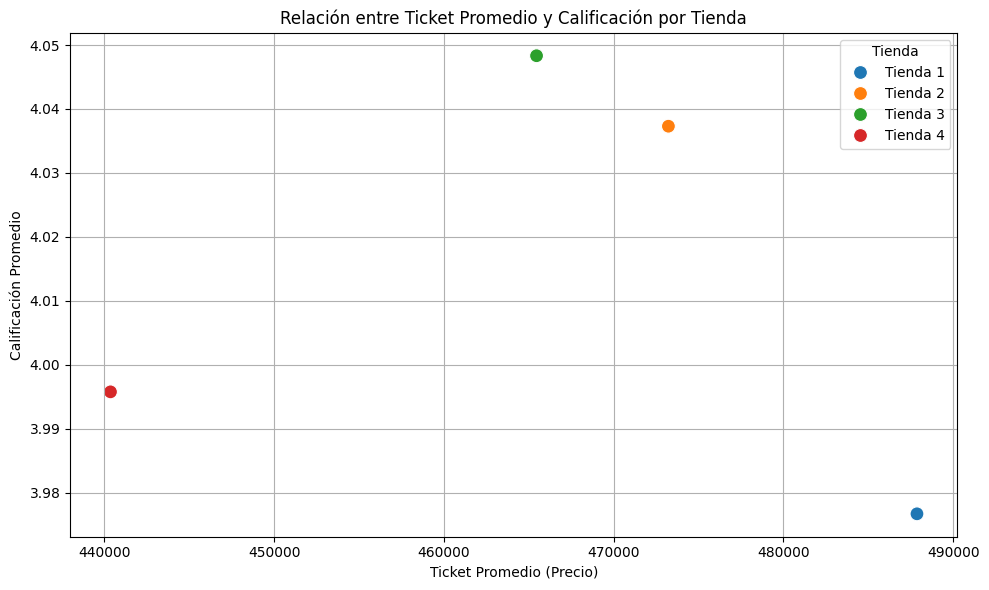

In [86]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=ventas_calificacion, x="Precio", y="Calificación", hue=ventas_calificacion.index, s=100)
plt.title("Relación entre Ticket Promedio y Calificación por Tienda")
plt.xlabel("Ticket Promedio (Precio)")
plt.ylabel("Calificación Promedio")
plt.grid(True)
plt.tight_layout()
plt.show()

# 4. Productos más y menos vendidos

In [87]:
productos_ventas = df_tiendas["Producto"].value_counts()
mas_vendidos = productos_ventas.head(5)
menos_vendidos = productos_ventas.tail(5)

/tmp/ipython-input-3040229834.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mas_vendidos.values, y=mas_vendidos.index, palette="Greens_r")


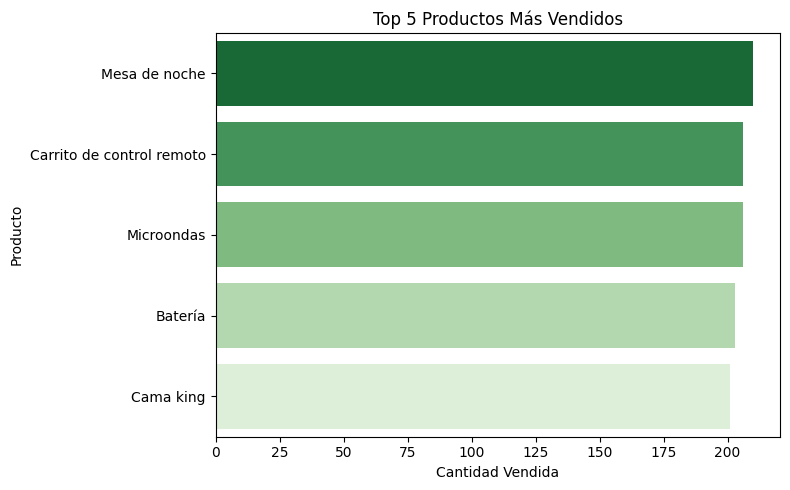

In [88]:
plt.figure(figsize=(8,5))
sns.barplot(x=mas_vendidos.values, y=mas_vendidos.index, palette="Greens_r")
plt.title("Top 5 Productos Más Vendidos")
plt.xlabel("Cantidad Vendida")
plt.ylabel("Producto")
plt.tight_layout()
plt.show()

/tmp/ipython-input-1479617119.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=menos_vendidos.values, y=menos_vendidos.index, palette="Reds")


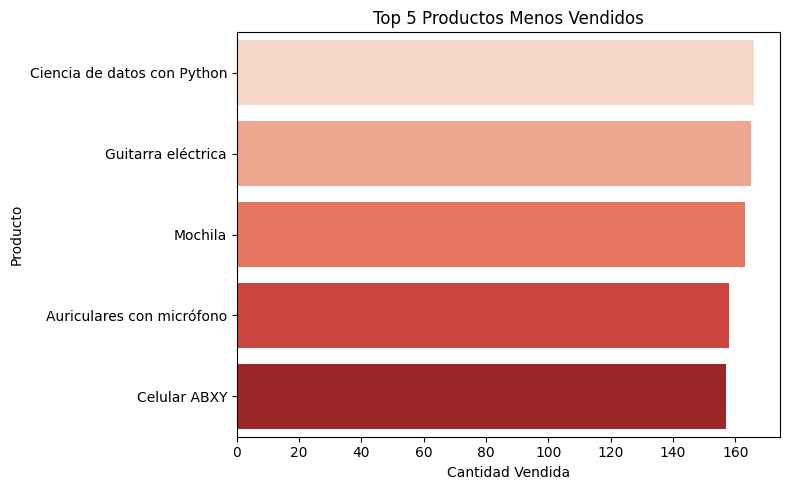

In [89]:
plt.figure(figsize=(8,5))
sns.barplot(x=menos_vendidos.values, y=menos_vendidos.index, palette="Reds")
plt.title("Top 5 Productos Menos Vendidos")
plt.xlabel("Cantidad Vendida")
plt.ylabel("Producto")
plt.tight_layout()
plt.show()

# 5. Envío promedio por tienda

In [90]:
import numpy as np

# Simulación de costos de envío entre 5 y 30 soles
df_tiendas["Costo de Envío"] = np.random.uniform(5, 30, size=len(df_tiendas))

envio_promedio = df_tiendas.groupby("Tienda")["Costo de Envío"].mean().sort_values()

/tmp/ipython-input-420752491.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=envio_promedio.values, y=envio_promedio.index, palette="coolwarm")


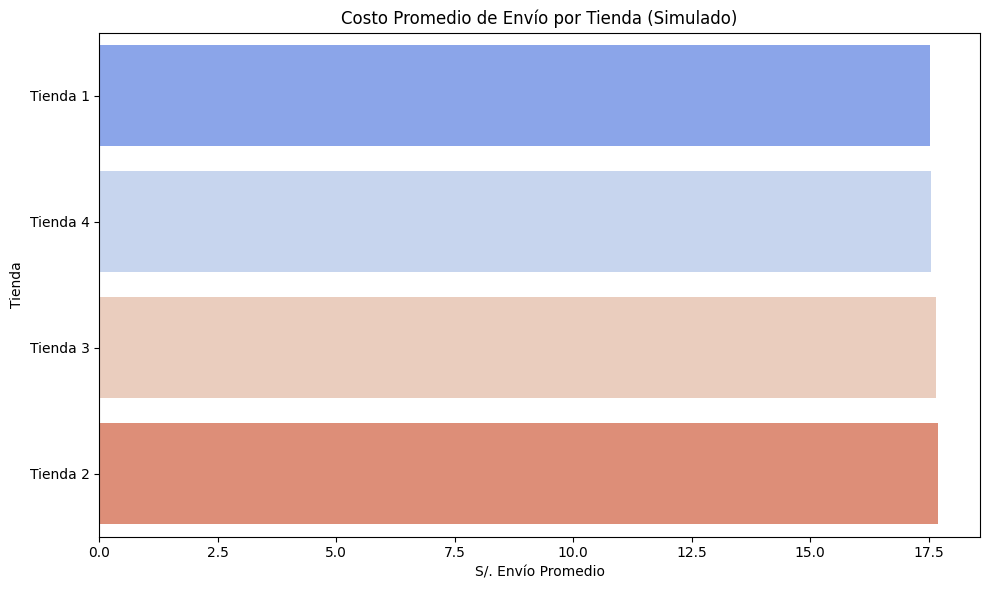

In [91]:
plt.figure(figsize=(10,6))
sns.barplot(x=envio_promedio.values, y=envio_promedio.index, palette="coolwarm")
plt.title("Costo Promedio de Envío por Tienda (Simulado)")
plt.xlabel("S/. Envío Promedio")
plt.ylabel("Tienda")
plt.tight_layout()
plt.show()